### Just Run at the starting of the assignment so that files can be opened up after making the shortcut

In [316]:
!unzip /content/drive/MyDrive/CV_Assignments/Assignment-1.zip
!sudo apt install tesseract-ocr
!pip install pytesseract==0.3.9
!pip install easyocr

Archive:  /content/drive/MyDrive/CV_Assignments/Assignment-1.zip
replace Assignment-1/Problem-3/circle.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2build2).
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 27 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 KB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.2/61

In [317]:
!wget 'https://upload.wikimedia.org/wikipedia/commons/thumb/7/77/Kolabafort_west_side.jpg/640px-thumb.jpg' -O Kolabafort.jpg
!wget 'https://upload.wikimedia.org/wikipedia/commons/thumb/2/23/Konar_Damm_Indien.jpg/640px-thumb.jpg' -O Konar_Dam.jpg
!wget 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0c/Kothandaramar_Temple%2C_Rameswaram.jpg/640px-thumb.jpg' -O Kothandaramar_Temple.jpg

--2023-02-05 13:50:01--  https://upload.wikimedia.org/wikipedia/commons/thumb/7/77/Kolabafort_west_side.jpg/640px-thumb.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 108746 (106K) [image/jpeg]
Saving to: ‘Kolabafort.jpg’

Kolabafort.jpg      100%[===================>] 106.20K  --.-KB/s    in 0.03s   

2023-02-05 13:50:02 (3.52 MB/s) - ‘Kolabafort.jpg’ saved [108746/108746]

--2023-02-05 13:50:02--  https://upload.wikimedia.org/wikipedia/commons/thumb/2/23/Konar_Damm_Indien.jpg/640px-thumb.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 131310 (128K) [image/jpeg]
Saving to: ‘Konar_Dam.jpg’

Konar_D

### Import Libraries and Utility Functions

In [318]:
import pytesseract
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import tarfile
import PIL
from matplotlib import pyplot as plt
import random
import os
from sklearn.neighbors import KNeighborsClassifier as KNC
from sklearn.svm import SVC
from sklearn.metrics import classification_report as cr
import math
import easyocr

# Problem Statement-1

In [ ]:
def mask(img):
  img2 = np.zeros(img.shape)
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      if img[i][j].all()!=0.0:
        img[i][j]=np.array([255.0,255.0,255.0])
        img2[i][j]=np.array([1.0,1.0,1.0])
  return img, img2

Original Image: (386, 700, 3)


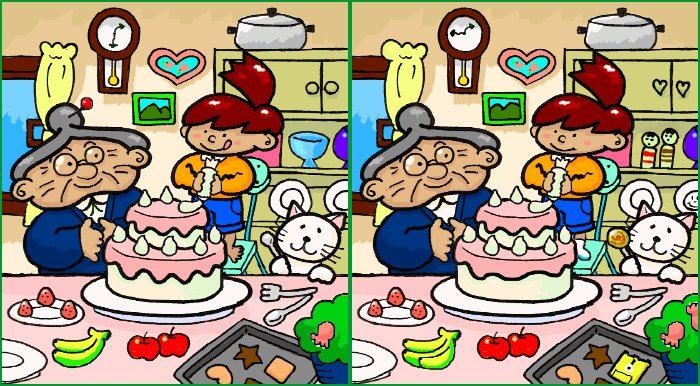

In [ ]:
img = cv2.imread('/content/Assignment-1/Problem-1/Spot_the_difference.png')
print("Original Image:",img.shape)
cv2_imshow(img)

Left-Half Image: (386, 350, 3)


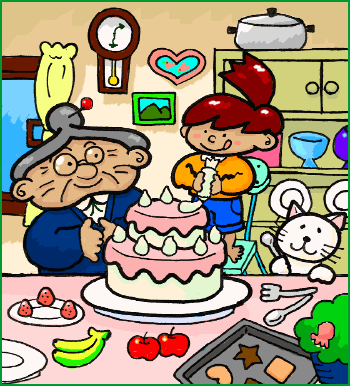

In [ ]:
img1 = img[:img.shape[0],:int(img.shape[1]/2),:]
print("Left-Half Image:",img1.shape)
cv2_imshow(img1)

Right-Half Image: (386, 350, 3)


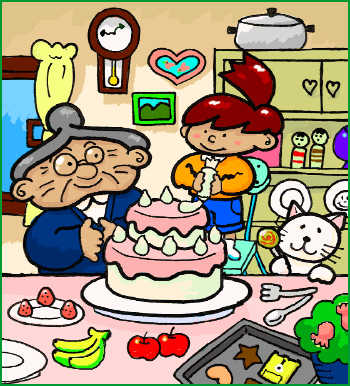

In [ ]:
img2 = img[:img.shape[0],int(img.shape[1]/2):,:]
print("Right-Half Image:",img2.shape)
cv2_imshow(img2)

Differences:


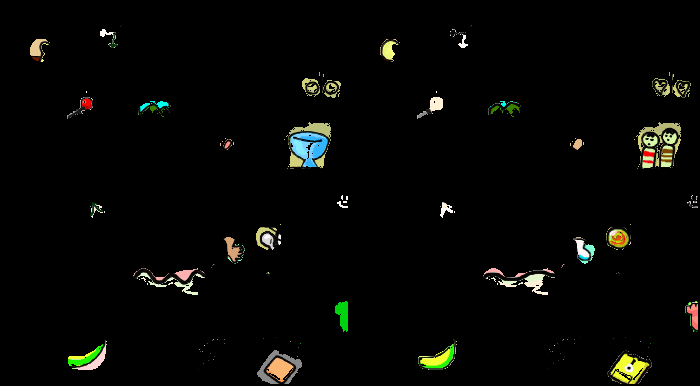

Segmented_Image:


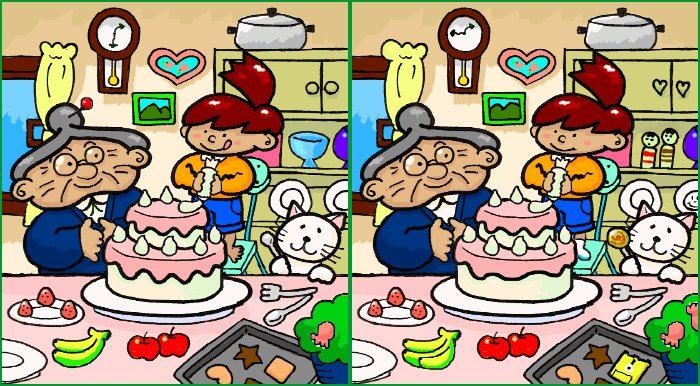

In [ ]:
sub_img = np.abs(img1 - img2)
seg_mask, internal_mask = mask(sub_img)
print("Differences:")
cv2_imshow(np.hstack((img1*internal_mask,img2*internal_mask)))
print("Segmented_Image:")
cv2_imshow(img)

# Problem Statement-2

In [332]:
def prompt(list_states, state1, state2):
  states=[]
  for i in range(0,len(list_states)):
    (_,Name,_) = list_states[i]
    if Name==state1 or Name==state2:
      states.append(list_states[i])
  return states[0], states[1]

def dist_calc(tuple1,tuple2):
  (coords1,Name1,conf1) = tuple1
  (coords2,Name2,conf2) = tuple2
  x_cord1 = int((coords1[0][0]+coords1[1][0])/2)
  x_cord2 = int((coords2[0][0]+coords2[1][0])/2)
  y_cord1 = int((coords1[0][1]+coords1[2][1])/2)
  y_cord2 = int((coords2[0][1]+coords2[2][1])/2)
  print("Distance between "+Name1+" and "+Name2+" = ",int((((x_cord1-x_cord2)**2)+((y_cord1-y_cord2)**2))**0.5))

Original Image: (834, 700, 3)


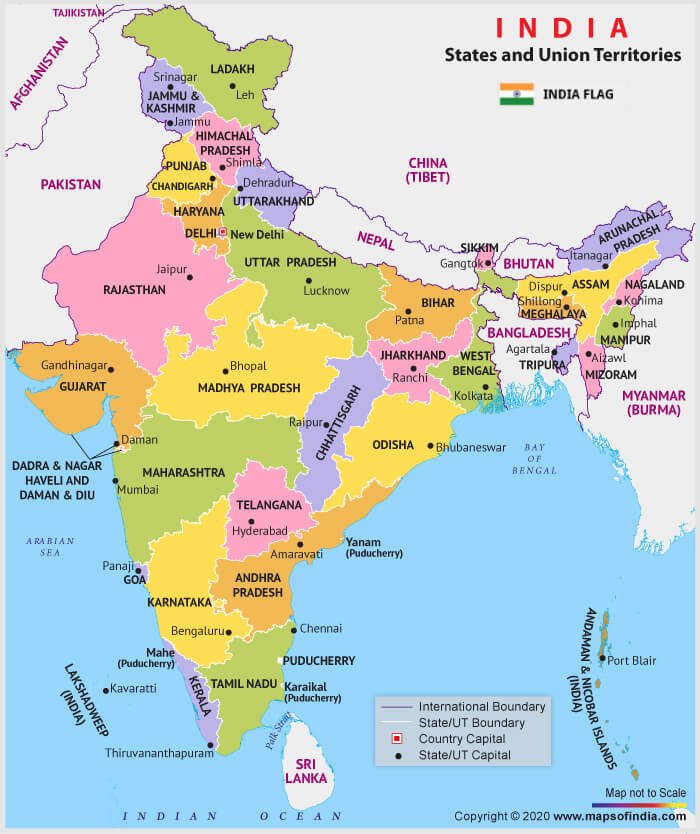

In [269]:
img = cv2.imread('/content/Assignment-1/Problem-2/india-map.jpg')
print("Original Image:",img.shape)
cv2_imshow(img)

In [325]:
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
img = cv2.filter2D(src=img, ddepth=-1, kernel=kernel)

In [333]:
reader = easyocr.Reader(['en'])
result = reader.readtext(img)
result

[([[51, 7], [99, 7], [99, 19], [51, 19]], 'TAJIKISTA', 0.9729158419392301),
 ([[516, 12], [634, 12], [634, 44], [516, 44]], 'N D | A', 0.445002081842014),
 ([[440, 42], [686, 42], [686, 66], [440, 66]],
  'States and Union Territories',
  0.8909634601244248),
 ([[207, 61], [259, 61], [259, 77], [207, 77]], 'LADAKH', 0.9980473924275202),
 ([[151, 71], [201, 71], [201, 85], [151, 85]],
  'Srinagar',
  0.9986999253460521),
 ([[147, 87], [189, 87], [189, 103], [147, 103]], 'JAMMU', 0.9995920999526882),
 ([[235, 87], [259, 87], [259, 103], [235, 103]], 'Leh:', 0.7289732694625854),
 ([[541, 87], [617, 87], [617, 103], [541, 103]],
  'INDIA FLAG',
  0.9877567631901435),
 ([[145, 103], [199, 103], [199, 117], [145, 117]],
  'KASHMIR',
  0.8555904273843142),
 ([[177, 117], [213, 117], [213, 131], [177, 131]],
  'ammy',
  0.9256749153137207),
 ([[195, 127], [257, 127], [257, 143], [195, 143]],
  'HIMACHALZ',
  0.5316294600598922),
 ([[199, 143], [253, 143], [253, 159], [199, 159]],
  'PRADESH',


In [336]:
t1, t2 = prompt(result, "KARNATAKA","TELANGANA")
dist_calc(t1, t2)

Distance between TELANGANA and KARNATAKA =  132


# Problem Statement-3

In [ ]:
def peri_area(img):
  peri=0
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      if img[i][j].all()==0:
        peri+=1
  radius = int((peri/(2*math.pi)))
  area = int(math.pi*radius**2)
  return area, peri, radius

def hough(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blurred = cv2.blur(gray, (3, 3))
  detected_circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, 1, 20, param1 = 50, param2 = 30, minRadius = 0, maxRadius = img.shape[1])
  actual_circles = np.uint16(np.around(detected_circles))
  for pt in detected_circles[0, :]:
    x, y, radius = pt[0], pt[1], pt[2]
    break
  return int(radius), int(2*math.pi*radius), int(math.pi*(radius**2))

Original Image: (526, 590, 4)


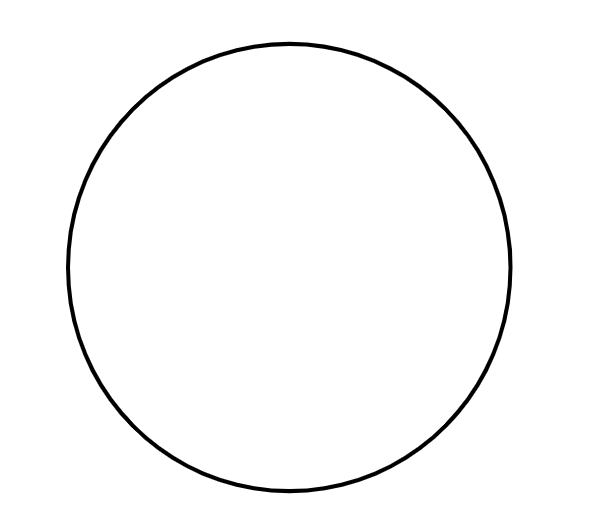

In [148]:
img = np.asarray(PIL.Image.open('/content/circle-updated.png'))
print("Original Image:",img.shape)
cv2_imshow(img[:,:,:3])

In [151]:
img_actual = img[:,:,:3]
area, peri, rad = peri_area(img_actual)
print("Area of Circle:- ",area)
print("Perimeter of Circle:- ",peri)
print("Radius of Circle:- ",rad)

Area of Circle:-  1478420
Perimeter of Circle:-  4314
Radius of Circle:-  686


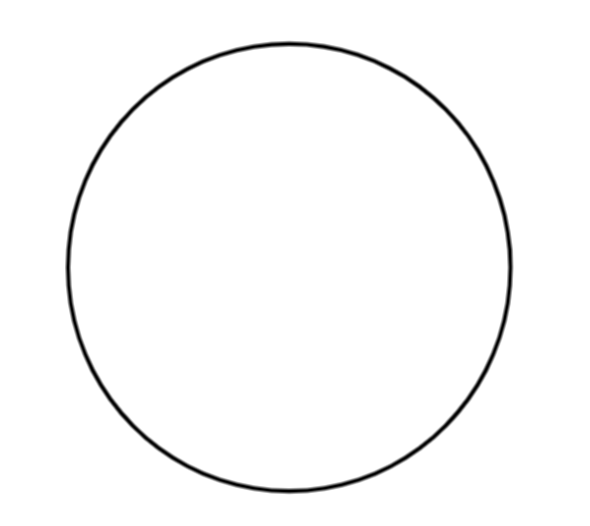

Area of Circle:-  48305
Perimeter of Circle:-  785
Radius of Circle:-  124


In [152]:
img_actual = cv2.blur(img[:,:,:3],(3,3))
cv2_imshow(img_actual)
area, peri, rad = peri_area(img_actual)
print("Area of Circle:- ",area)
print("Perimeter of Circle:- ",peri)
print("Radius of Circle:- ",rad)

In [158]:
rad, peri, area = hough(img[:,:,:3])
print("Area of Circle:- ",area)
print("Perimeter of Circle:- ",peri)
print("Radius of Circle:- ",rad)

Area of Circle:-  155668
Perimeter of Circle:-  1398
Radius of Circle:-  222


# Problem Statement-4

In [ ]:
def grad_matrix(img):
  im = np.float32(img)/ 255.0
  x = cv2.Sobel(im, cv2.CV_32F, 1, 0, ksize=1)
  y = cv2.Sobel(im, cv2.CV_32F, 0, 1, ksize=1)
  mag, angle = cv2.cartToPolar(x, y, angleInDegrees=True)
  return x, y, mag, angle

def line(img,gray_img):
  edges = cv2.Canny(gray_img,50,150,apertureSize=3)
  lines_list =[]
  mag_list=[]
  ang_list=[]
  mag=0
  lines = cv2.HoughLinesP(edges,1,np.pi/180,threshold=75,minLineLength=0,maxLineGap=10)
  for points in lines:
    x1,y1,x2,y2=points[0]
    cv2.line(img,(x1,y1),(x2,y2),(0,255,0),2)
    lines_list.append([(x1,y1),(x2,y2)])
    mag_list.append((((x1-x2)**2)+((y1-y2)**2))**0.5)
    ang_list.append((y2-y1)/(x2-x1))
  cv2_imshow(img)
  hand1 = max(mag_list)
  ang1 = ang_list[mag_list.index(hand1)]
  print(hand1,ang1)

Original Image: (225, 225)


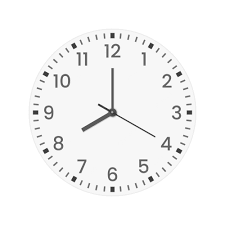

In [220]:
img_rgb = cv2.imread('/content/Assignment-1/Problem-4/clock_1.png')
img = cv2.imread('/content/Assignment-1/Problem-4/clock_1.png',0)
print("Original Image:",img.shape)
cv2_imshow(img)

Original Image: (586, 612)


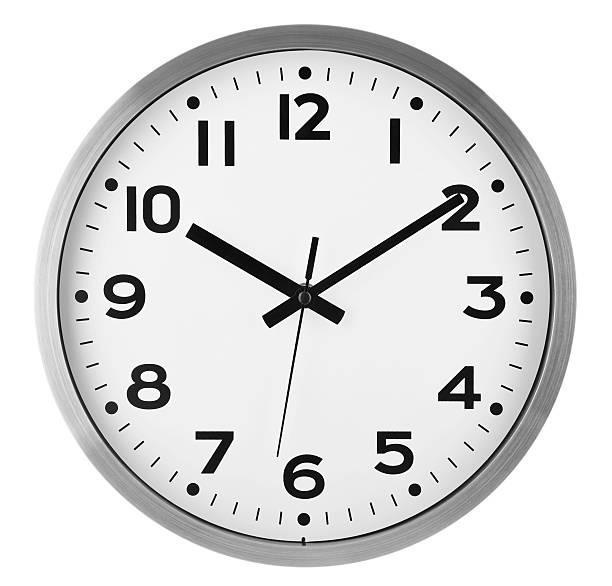

In [221]:
img1_rgb = cv2.imread('/content/Assignment-1/Problem-4/clock_2.jpg')
img1 = cv2.imread('/content/Assignment-1/Problem-4/clock_2.jpg',0)
print("Original Image:",img1.shape)
cv2_imshow(img1)

(array([43094.,   157.,   120.,   314.,   162.,   183.,   163.,   907.,
          155.,   180.,   151.,   300.,   132.,   142.,   196.,  1067.,
          141.,   138.,   307.,   173.,   151.,   151.,   886.,   146.,
          152.,   160.,   311.,   140.,   146.,   200.]),
 array([  0.      ,  11.987991,  23.975983,  35.963974,  47.951965,
         59.939957,  71.92795 ,  83.91594 ,  95.90393 , 107.89192 ,
        119.87991 , 131.8679  , 143.8559  , 155.84389 , 167.83188 ,
        179.81987 , 191.80786 , 203.79585 , 215.78384 , 227.77184 ,
        239.75983 , 251.74782 , 263.7358  , 275.72382 , 287.7118  ,
        299.69977 , 311.68777 , 323.67578 , 335.66376 , 347.65173 ,
        359.63974 ], dtype=float32),
 <a list of 30 Patch objects>)

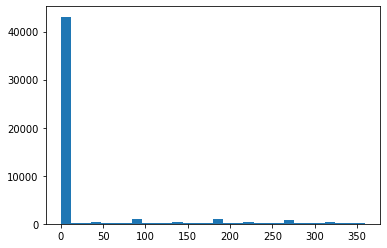

In [219]:
gx,gy,mag,ang = grad_matrix(img)
plt.hist(ang.reshape(-1),bins=30)

(array([  1268.,    772.,    644.,    517.,    486.,    388.,    415.,
           433.,    469.,    547.,    685.,    991.,   1832.,   7262.,
         52851., 271692.,   7004.,   2003.,   1137.,    983.,    894.,
           783.,    599.,    455.,    448.,    438.,    386.,    347.,
           551.,   1352.]),
 array([-1.        , -0.93333334, -0.8666667 , -0.8       , -0.73333335,
        -0.6666667 , -0.6       , -0.53333336, -0.46666667, -0.4       ,
        -0.33333334, -0.26666668, -0.2       , -0.13333334, -0.06666667,
         0.        ,  0.06666667,  0.13333334,  0.2       ,  0.26666668,
         0.33333334,  0.4       ,  0.46666667,  0.53333336,  0.6       ,
         0.6666667 ,  0.73333335,  0.8       ,  0.8666667 ,  0.93333334,
         1.        ], dtype=float32),
 <a list of 30 Patch objects>)

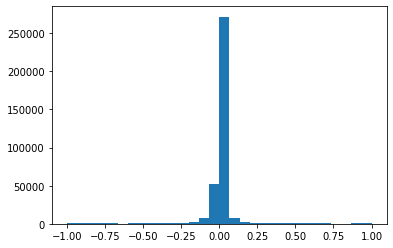

In [218]:
plt.hist(gx.reshape(-1),bins=30)

(array([  1282.,    726.,    439.,    398.,    365.,    426.,    532.,
           706.,    755.,    683.,    769.,    909.,   1502.,   6003.,
         51373., 275244.,   6321.,   1993.,   1265.,   1115.,    860.,
           616.,    492.,    359.,    328.,    305.,    328.,    462.,
           789.,   1287.]),
 array([-1.        , -0.93333334, -0.8666667 , -0.8       , -0.73333335,
        -0.6666667 , -0.6       , -0.53333336, -0.46666667, -0.4       ,
        -0.33333334, -0.26666668, -0.2       , -0.13333334, -0.06666667,
         0.        ,  0.06666667,  0.13333334,  0.2       ,  0.26666668,
         0.33333334,  0.4       ,  0.46666667,  0.53333336,  0.6       ,
         0.6666667 ,  0.73333335,  0.8       ,  0.8666667 ,  0.93333334,
         1.        ], dtype=float32),
 <a list of 30 Patch objects>)

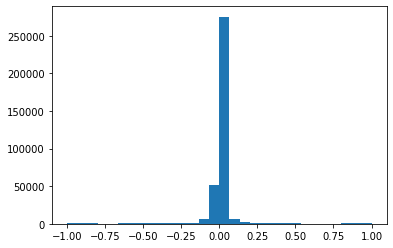

In [217]:
plt.hist(gy.reshape(-1),bins=30)

(array([215107.,   4114.,   3975.,   5744.,   3629.,   4283.,   3330.,
         12208.,   3312.,   3927.,   3126.,   5766.,   3884.,   3571.,
          3447.,  15793.,   3661.,   4026.,   5860.,   3266.,   3917.,
          3172.,  12883.,   3204.,   3775.,   3079.,   5299.,   3940.,
          3615.,   3719.]),
 array([  0.      ,  11.992422,  23.984844,  35.97727 ,  47.96969 ,
         59.962112,  71.95454 ,  83.94696 ,  95.93938 , 107.9318  ,
        119.924225, 131.91664 , 143.90907 , 155.90149 , 167.89392 ,
        179.88634 , 191.87875 , 203.87119 , 215.8636  , 227.85603 ,
        239.84845 , 251.84087 , 263.83328 , 275.8257  , 287.81815 ,
        299.81055 , 311.80298 , 323.7954  , 335.78784 , 347.78024 ,
        359.77267 ], dtype=float32),
 <a list of 30 Patch objects>)

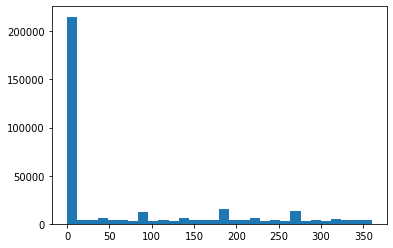

In [216]:
gx,gy,mag,ang = grad_matrix(img1)
plt.hist(ang.reshape(-1),bins=30)

(array([  1268.,    772.,    644.,    517.,    486.,    388.,    415.,
           433.,    469.,    547.,    685.,    991.,   1832.,   7262.,
         52851., 271692.,   7004.,   2003.,   1137.,    983.,    894.,
           783.,    599.,    455.,    448.,    438.,    386.,    347.,
           551.,   1352.]),
 array([-1.        , -0.93333334, -0.8666667 , -0.8       , -0.73333335,
        -0.6666667 , -0.6       , -0.53333336, -0.46666667, -0.4       ,
        -0.33333334, -0.26666668, -0.2       , -0.13333334, -0.06666667,
         0.        ,  0.06666667,  0.13333334,  0.2       ,  0.26666668,
         0.33333334,  0.4       ,  0.46666667,  0.53333336,  0.6       ,
         0.6666667 ,  0.73333335,  0.8       ,  0.8666667 ,  0.93333334,
         1.        ], dtype=float32),
 <a list of 30 Patch objects>)

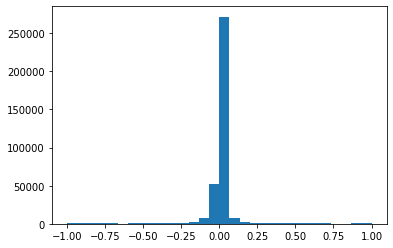

In [215]:
plt.hist(gx.reshape(-1),bins=30)

(array([  1282.,    726.,    439.,    398.,    365.,    426.,    532.,
           706.,    755.,    683.,    769.,    909.,   1502.,   6003.,
         51373., 275244.,   6321.,   1993.,   1265.,   1115.,    860.,
           616.,    492.,    359.,    328.,    305.,    328.,    462.,
           789.,   1287.]),
 array([-1.        , -0.93333334, -0.8666667 , -0.8       , -0.73333335,
        -0.6666667 , -0.6       , -0.53333336, -0.46666667, -0.4       ,
        -0.33333334, -0.26666668, -0.2       , -0.13333334, -0.06666667,
         0.        ,  0.06666667,  0.13333334,  0.2       ,  0.26666668,
         0.33333334,  0.4       ,  0.46666667,  0.53333336,  0.6       ,
         0.6666667 ,  0.73333335,  0.8       ,  0.8666667 ,  0.93333334,
         1.        ], dtype=float32),
 <a list of 30 Patch objects>)

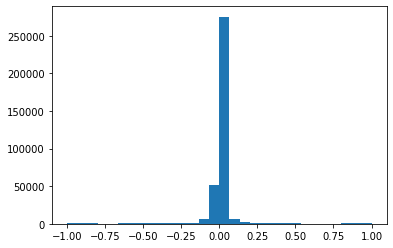

In [214]:
plt.hist(gy.reshape(-1),bins=30)

<ipython-input-265-5da454d57d6b>:128: RuntimeWarning: divide by zero encountered in int_scalars
  ang_list.append((y2-y1)/(x2-x1))


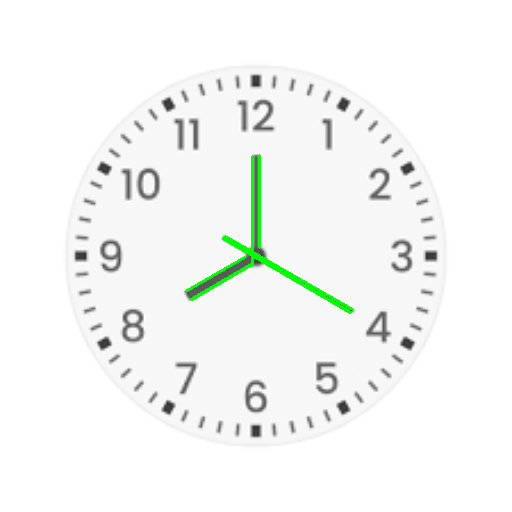

146.98639392814562 0.5826771653543307


In [266]:
line(cv2.resize(img_rgb,(512,512)),cv2.resize(img,(512,512)))

<ipython-input-265-5da454d57d6b>:128: RuntimeWarning: divide by zero encountered in int_scalars
  ang_list.append((y2-y1)/(x2-x1))


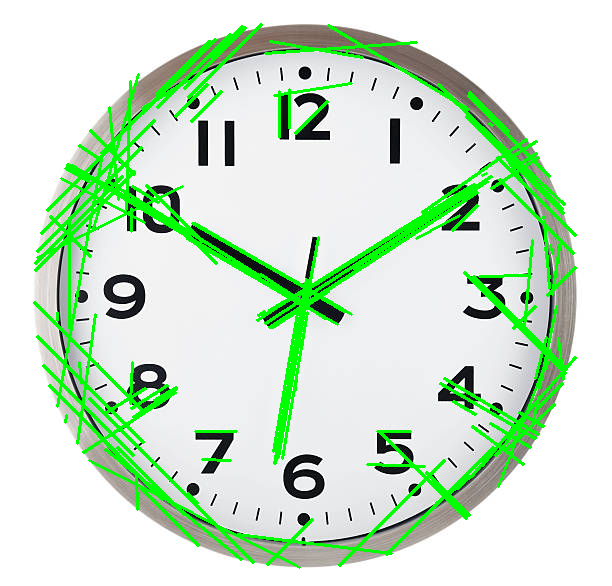

230.0195643852931 -0.6256410256410256


In [267]:
line(img1_rgb,img1)

# Problem Statement-5

In [338]:
def resize_gray(img, shape_tuple):
  resized_img = cv2.resize(img, shape_tuple)
  gray_img = cv2.cvtColor(resized_img, cv2.COLOR_RGB2GRAY)
  return gray_img

def salt_noise(img, prob):
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      pixel_prob = random.random()
      if pixel_prob<=prob:
        img[i][j]=255
  return img

Original Image: (480, 640, 3)


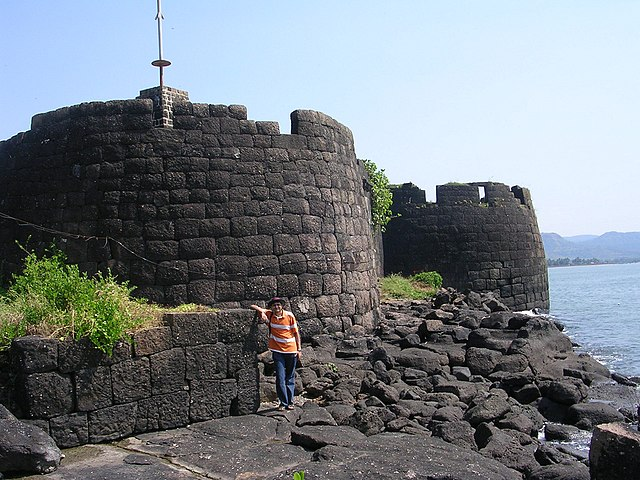

In [339]:
img = cv2.imread('/content/Kolabafort.jpg')
print("Original Image:",img.shape)
cv2_imshow(img)

Original Image: (469, 640, 3)


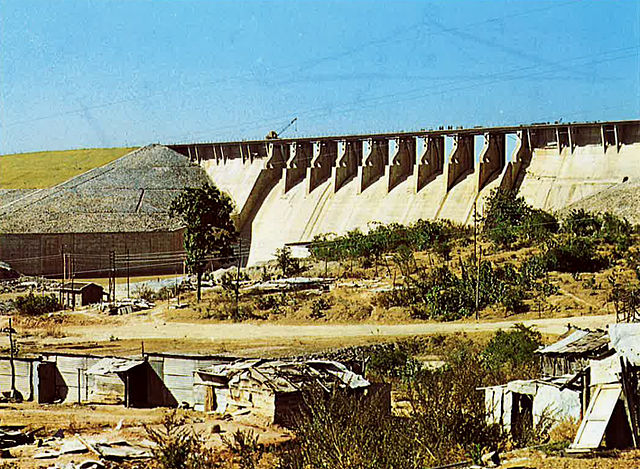

In [340]:
img1 = cv2.imread('/content/Konar_Dam.jpg')
print("Original Image:",img1.shape)
cv2_imshow(img1)

Original Image: (427, 640, 3)


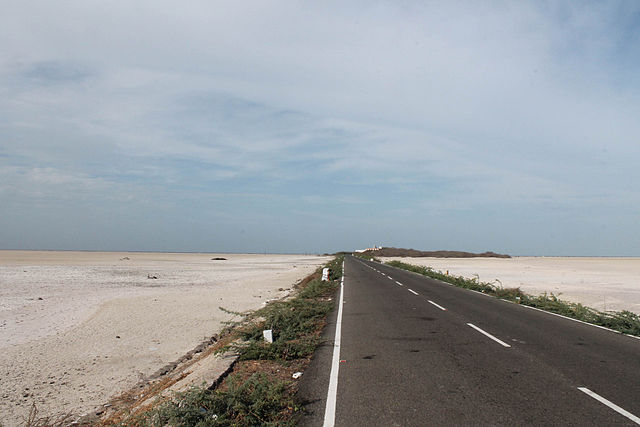

In [341]:
img2 = cv2.imread('/content/Kothandaramar_Temple.jpg')
print("Original Image:",img2.shape)
cv2_imshow(img2)

In [ ]:
print('Average of Pixels for Image-1:-', np.mean(img))
print('Average of Pixels for Image-2:-', np.mean(img1))
print('Average of Pixels for Image-3:-', np.mean(img2))

Average of Pixels for Image-1:- 124.89972873263889
Average of Pixels for Image-2:- 132.04103367093106
Average of Pixels for Image-3:- 156.67532323380172


In [343]:
resize_img = cv2.resize(img, (256,256))
resize_img1 = cv2.resize(img1, (256,256))
resize_img2 = cv2.resize(img2, (256,256))

In [345]:
print('Average of Pixels for Image-1 after resizing:-', np.mean(resize_img))
print('Average of Pixels for Image-2 after resizing:-', np.mean(resize_img1))
print('Average of Pixels for Image-3 after resizing:-', np.mean(resize_img2))

Average of Pixels for Image-1 after resizing:- 124.78678894042969
Average of Pixels for Image-2 after resizing:- 131.9117431640625
Average of Pixels for Image-3 after resizing:- 156.57013448079428


Average of Pixels for Images:- 45.86646525065104


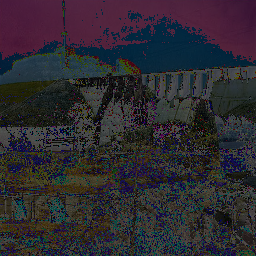

In [ ]:
avg_resize_img = (resize_img+resize_img1+resize_img2)/3
print('Average of Pixels for Images:-', np.mean(avg_resize_img))
cv2_imshow(avg_resize_img)

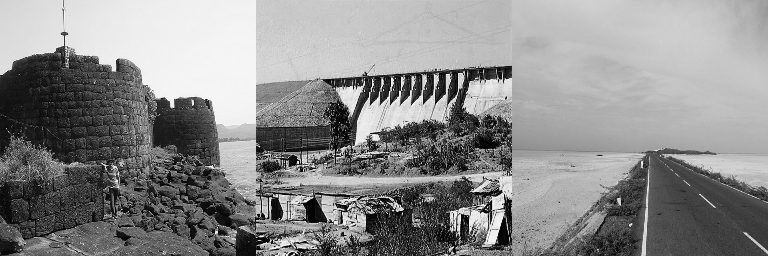

In [346]:
gr_img = resize_gray(img, (256,256))
gr_img1 = resize_gray(img1, (256,256))
gr_img2 = resize_gray(img2, (256,256))
comp = np.hstack((gr_img,gr_img1,gr_img2))
cv2_imshow(comp)

In [347]:
print('Average of Pixels for Image-1:-', np.mean(gr_img))
print('Average of Pixels for Image-2:-', np.mean(gr_img1))
print('Average of Pixels for Image-3:-', np.mean(gr_img2))

Average of Pixels for Image-1:- 126.11380004882812
Average of Pixels for Image-2:- 134.77798461914062
Average of Pixels for Image-3:- 157.49191284179688


Average of Pixels for Images after grayscaled resizing:- 43.191701253255204


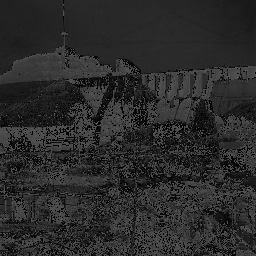

In [349]:
gr_avg_img = (gr_img+gr_img1+gr_img2)/3
print('Average of Pixels for Images after grayscaled resizing:-', np.mean(gr_avg_img))
cv2_imshow(gr_avg_img)

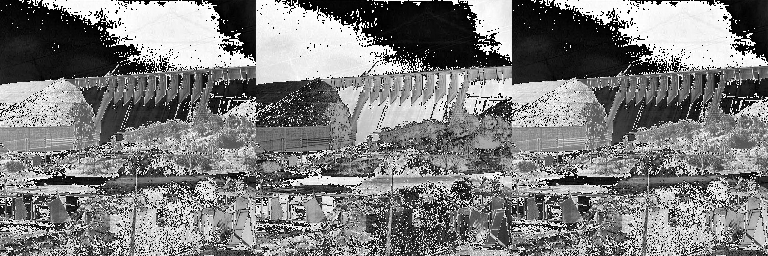

In [350]:
dif1 = gr_img1-gr_img2
dif2 = gr_img2-gr_img1
abso = np.abs(dif1)
comp = np.hstack((dif1,dif2,abso))
cv2_imshow(comp)

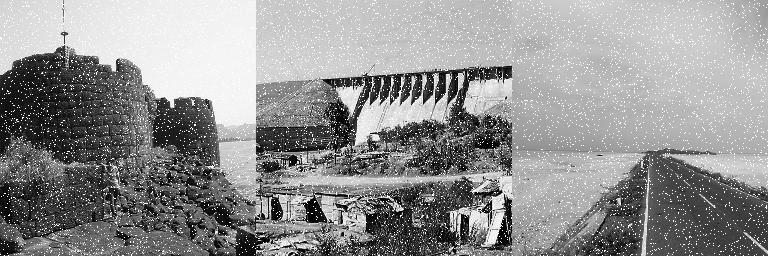

In [351]:
salt_img = salt_noise(gr_img, 0.05)
salt_img1 = salt_noise(gr_img1, 0.05)
salt_img2 = salt_noise(gr_img2, 0.05)
salt_comp = np.hstack((salt_img,salt_img1,salt_img2))
cv2_imshow(salt_comp)

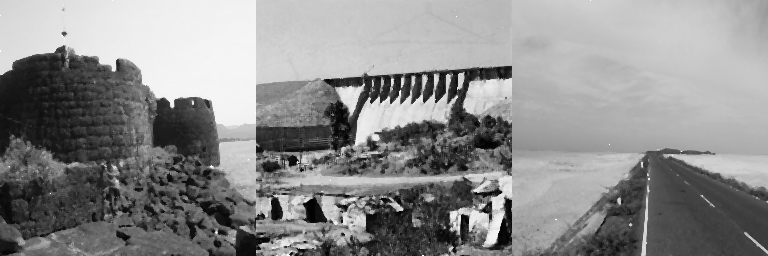

In [ ]:
denoised_img = cv2.medianBlur(salt_img, 3)
denoised_img1 = cv2.medianBlur(salt_img1, 3)
denoised_img2 = cv2.medianBlur(salt_img2, 3)
denoised_comp = np.hstack((denoised_img,denoised_img1,denoised_img2))
cv2_imshow(denoised_comp)

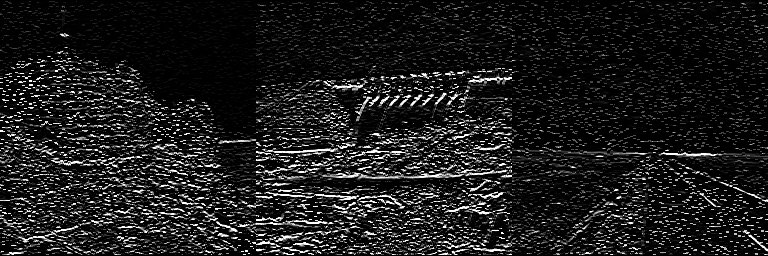

In [ ]:
kernel = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
conv_img = cv2.filter2D(img,-1,kernel)
conv_img1 = cv2.filter2D(img1,-1,kernel)
conv_img2 = cv2.filter2D(img2,-1,kernel)
conv_comp = np.hstack((conv_img,conv_img1,conv_img2))
cv2_imshow(conv_comp)

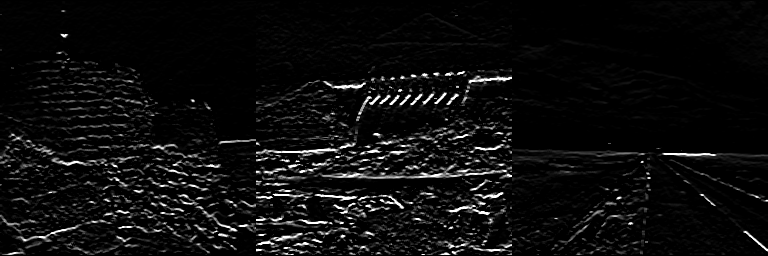

In [ ]:
conv_denoised_img = cv2.filter2D(denoised_img,-1,kernel)
conv_denoised_img1 = cv2.filter2D(denoised_img1,-1,kernel)
conv_denoised_img2 = cv2.filter2D(denoised_img2,-1,kernel)
conv_denoised_comp = np.hstack((conv_denoised_img,conv_denoised_img1,conv_denoised_img2))
cv2_imshow(conv_denoised_comp)

# Problem Statement-6

In [ ]:
def matrix(dir,mode='default'):
  mat=[]
  for name in os.listdir(dir):
    if mode!='default':
      img = cv2.imread(dir+'/'+name,0)
      img[img!=0] = 1
      mat_sum = np.sum(img,axis=1)
      mat.append(mat_sum)
    else:
      img = cv2.imread(dir+'/'+name)
      mat.append(np.reshape(img,-1))
  return np.array(mat)

In [337]:
!git clone 'https://github.com/myleott/mnist_png.git'

Cloning into 'mnist_png'...
remote: Enumerating objects: 13, done.
remote: Total 13 (delta 0), reused 0 (delta 0), pack-reused 13
Unpacking objects: 100% (13/13), 14.95 MiB | 13.27 MiB/s, done.


In [ ]:
file = tarfile.open('/content/mnist_png/mnist_png.tar.gz')
file.extractall('/content/mnist_png/mnist_png_images')
file.close()

In [ ]:
img = cv2.imread('/content/mnist_png/mnist_png_images/mnist_png/training/0/1.png')
print("Original Image:",img.shape)
cv2_imshow(img)

Original Image: (28, 28, 3)


In [ ]:
img1 = cv2.imread('/content/mnist_png/mnist_png_images/mnist_png/training/1/10006.png')
print("Original Image:",img1.shape)
cv2_imshow(img1)

Original Image: (28, 28, 3)


In [ ]:
zero_dir = '/content/mnist_png/mnist_png_images/mnist_png/training/0'
one_dir = '/content/mnist_png/mnist_png_images/mnist_png/training/1'
zero_matrix = matrix(zero_dir)
one_matrix = matrix(one_dir)
zero_labels = np.array([0]*zero_matrix.shape[0])
one_labels = np.array([1]*one_matrix.shape[0])

In [ ]:
zero_dirtest = '/content/mnist_png/mnist_png_images/mnist_png/testing/0'
one_dirtest = '/content/mnist_png/mnist_png_images/mnist_png/testing/1'
zero_test = matrix(zero_dirtest)
one_test = matrix(one_dirtest)
zero_labels_test = np.array([0]*zero_test.shape[0])
one_labels_test = np.array([1]*one_test.shape[0])

In [ ]:
train_matrix = np.concatenate((zero_matrix,one_matrix),axis=0)
train_labels = np.concatenate((zero_labels,one_labels),axis=0)
shuffled_indices = np.random.permutation(train_matrix.shape[0])
train_matrix=train_matrix[shuffled_indices]
train_labels=train_labels[shuffled_indices]

In [ ]:
test_matrix = np.concatenate((zero_test,one_test),axis=0)
test_labels = np.concatenate((zero_labels_test,one_labels_test),axis=0)
shuffled_indices_test = np.random.permutation(test_matrix.shape[0])
test_matrix=test_matrix[shuffled_indices_test]
test_labels=test_labels[shuffled_indices_test]

In [ ]:
model_knn = KNC(n_neighbors=5,n_jobs=-1)
model_knn.fit(train_matrix,train_labels)
test_pred = model_knn.predict(test_matrix)

model_svm = SVC(kernel='poly')
model_svm.fit(train_matrix,train_labels)
test_pred1 = model_svm.predict(test_matrix)

In [ ]:
print(cr(test_labels,test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       980
           1       1.00      1.00      1.00      1135

    accuracy                           1.00      2115
   macro avg       1.00      1.00      1.00      2115
weighted avg       1.00      1.00      1.00      2115



In [ ]:
print(cr(test_labels,test_pred1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       980
           1       1.00      1.00      1.00      1135

    accuracy                           1.00      2115
   macro avg       1.00      1.00      1.00      2115
weighted avg       1.00      1.00      1.00      2115



In [ ]:
zero_matrix1 = matrix(zero_dir,'horizontal')
one_matrix1 = matrix(one_dir,'horizontal')
zero_labels1 = np.array([0]*zero_matrix1.shape[0])
one_labels1 = np.array([1]*one_matrix1.shape[0])

zero_test1 = matrix(zero_dirtest,'horizontal')
one_test1 = matrix(one_dirtest,'horizontal')
zero_labels_test1 = np.array([0]*zero_test1.shape[0])
one_labels_test1 = np.array([1]*one_test1.shape[0])

In [ ]:
train_matrix1 = np.concatenate((zero_matrix1,one_matrix1),axis=0)
train_labels1 = np.concatenate((zero_labels1,one_labels1),axis=0)
shuffled_indices1 = np.random.permutation(train_matrix1.shape[0])
train_matrix1=train_matrix1[shuffled_indices1]
train_labels1=train_labels1[shuffled_indices1]

test_matrix1 = np.concatenate((zero_test1,one_test1),axis=0)
test_labels1 = np.concatenate((zero_labels_test1,one_labels_test1),axis=0)
shuffled_indices_test1 = np.random.permutation(test_matrix1.shape[0])
test_matrix1=test_matrix1[shuffled_indices_test1]
test_labels1=test_labels1[shuffled_indices_test1]

In [ ]:
model_knn1 = KNC(n_neighbors=10,n_jobs=-1)
model_knn1.fit(train_matrix1,train_labels1)
test_pred11 = model_knn1.predict(test_matrix1)

model_svm1 = SVC(kernel='linear')
model_svm1.fit(train_matrix1,train_labels1)
test_pred12 = model_svm1.predict(test_matrix1)

In [ ]:
print(cr(test_labels1,test_pred11))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       980
           1       0.99      0.99      0.99      1135

    accuracy                           0.99      2115
   macro avg       0.99      0.99      0.99      2115
weighted avg       0.99      0.99      0.99      2115



In [ ]:
print(cr(test_labels1,test_pred12))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       980
           1       0.98      0.97      0.98      1135

    accuracy                           0.97      2115
   macro avg       0.97      0.97      0.97      2115
weighted avg       0.97      0.97      0.97      2115



# Problem Statement-7

In [ ]:
def sliding(img):
  list_horizontal = []
  reference_value=0
  for index in range(img.shape[1]):
    pixel_sum = np.apply_over_axes(np.sum, img[:,index,:], [0,1])
    list_horizontal.append(np.round(np.log(pixel_sum)).item(0))
    if index==0:
      reference_value = np.round(np.log(pixel_sum)).item(0)
  return reference_value, list_horizontal

def decision(reference_value, list_pixels):
  unique_list = np.unique(np.array(list_pixels)).tolist()
  count_less=0
  count_more=0
  sign=0
  for i in unique_list:
    if i!=reference_value and i<reference_value:
      count_less+=list_pixels.count(i)
      sign-=1
    if i!=reference_value and i>reference_value:
      count_more+=list_pixels.count(i)
      sign+=1
  if sign<0 and count_less>list_pixels.count(reference_value):
    print("Dark Text on Bright Background")
  elif sign>0 and count_more>list_pixels.count(reference_value):
    print("Bright Text on Dark Background")
  else:
    if count_less<count_more:
      print("Bright Text on Dark Background")
    else:
      print("Dark Text on Bright Background")

Original Image: (129, 209, 3)


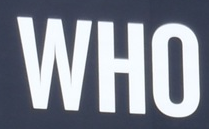

In [117]:
img = cv2.imread('/content/Assignment-1/Problem-7/11_1.png')
print("Original Image:",img.shape)
cv2_imshow(img)

Original Image: (63, 144, 3)


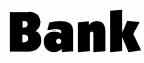

In [118]:
img1 = cv2.imread('/content/Assignment-1/Problem-7/27_2.png')
print("Original Image:",img1.shape)
cv2_imshow(img1)

Horizontally projected Value for background =  10.0
Bright Text on Dark Background


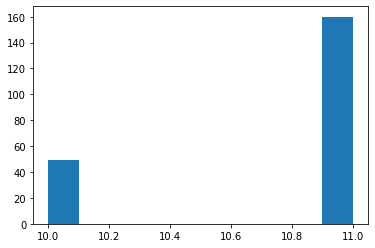

In [119]:
ref, result = sliding(img)
print("Horizontally projected Value for background = ",ref)
plt.hist(result)
decision(ref, result)

Horizontally projected Value for background =  11.0
Dark Text on Bright Background


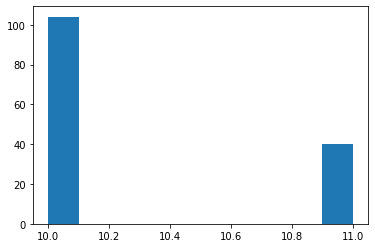

In [120]:
ref1, result1 = sliding(img1)
print("Horizontally projected Value for background = ",ref1)
plt.hist(result1)
decision(ref1, result1)

# Problem Statement-8

In [ ]:
def detect(img_dir1, img_dir2, threshold, technique):
  img_ref = cv2.imread(img_dir1)
  img = cv2.imread(img_dir1,0)
  img1 = cv2.imread(img_dir2,0)
  w, h = img1.shape[1], img1.shape[0]
  res = cv2.matchTemplate(img, img1, technique)
  loc = np.where(res >= threshold)
  for pt in zip(*loc[::-1]):
    cv2.rectangle(img_ref, pt, (pt[0] + w, pt[1] + h), (255, 0, 0), 2)
  cv2_imshow(img_ref)
  del img_ref, img, img1

Name Image: (531, 1579)


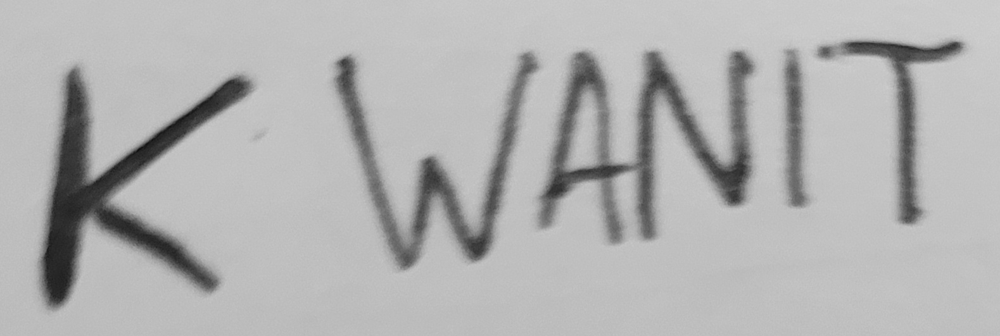

In [83]:
img_ref = cv2.imread('/content/Name.jpg')
img = cv2.imread('/content/Name.jpg',0)
print("Name Image:",img.shape)
cv2_imshow(img)

Letter_1 Image: (480, 447)


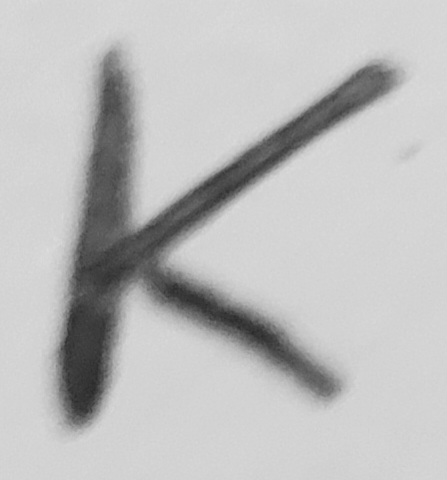

In [69]:
img1 = cv2.imread('/content/Letter.jpg',0)
print("Letter_1 Image:",img1.shape)
cv2_imshow(img1)

Letter-I Image: (286, 75)


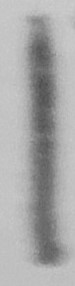

In [79]:
img2 = cv2.imread('/content/Letter_I.jpg',0)
print("Letter-I Image:",img2.shape)
cv2_imshow(img2)

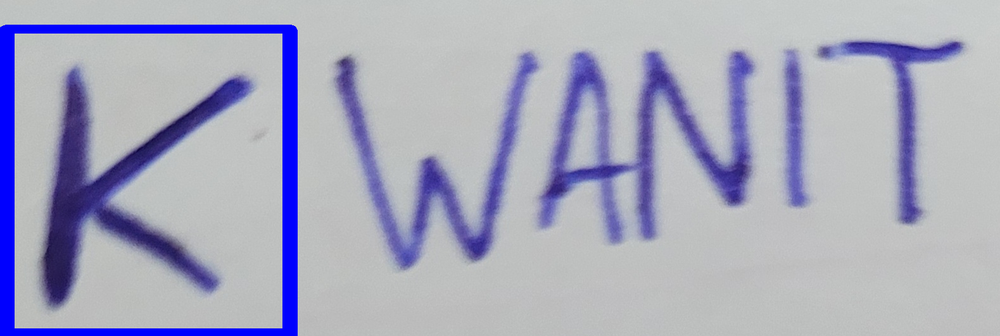

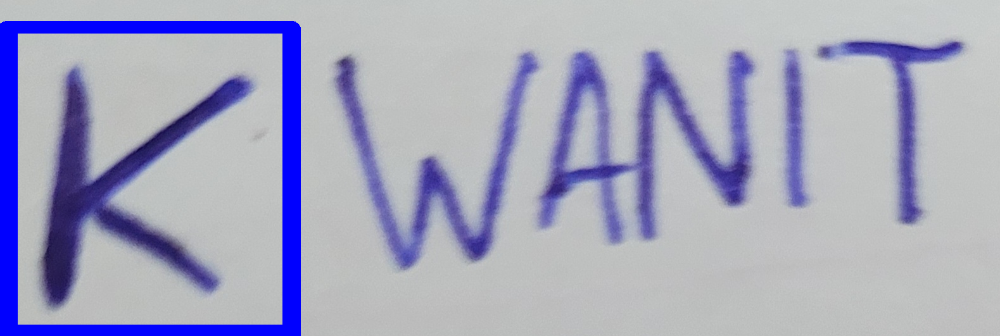

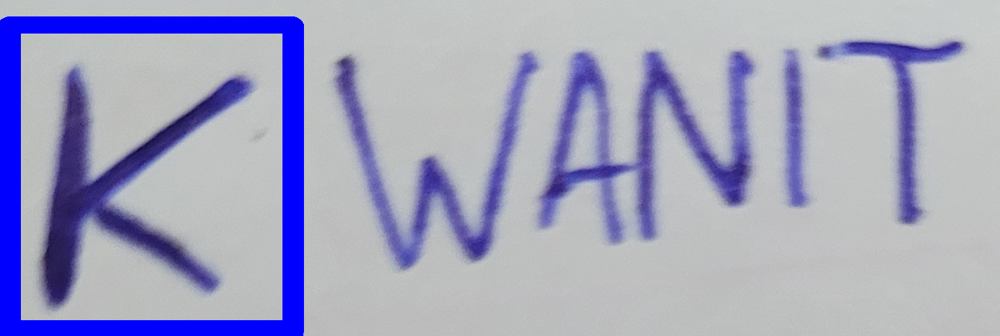

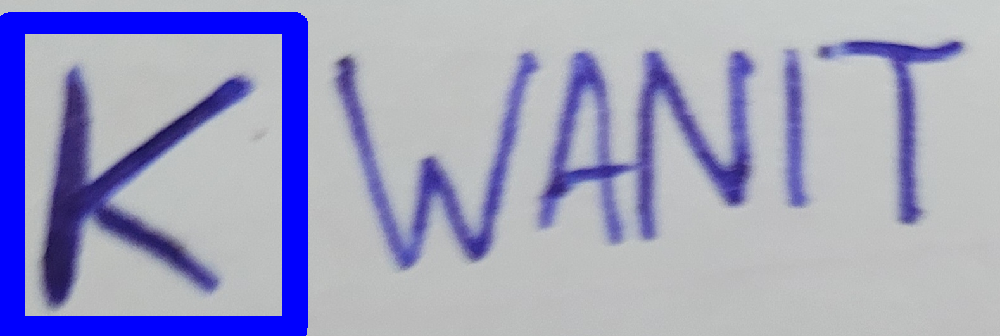

In [91]:
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED']

detect('/content/Name.jpg','/content/Letter.jpg',0.8,cv2.TM_CCOEFF_NORMED)
detect('/content/Name.jpg','/content/Letter.jpg',0.7,cv2.TM_CCOEFF_NORMED)
detect('/content/Name.jpg','/content/Letter.jpg',0.6,cv2.TM_CCOEFF_NORMED)
detect('/content/Name.jpg','/content/Letter.jpg',0.5,cv2.TM_CCOEFF_NORMED)

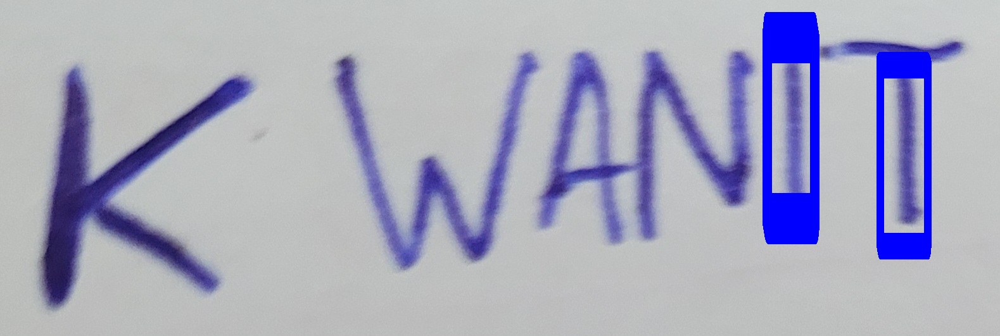

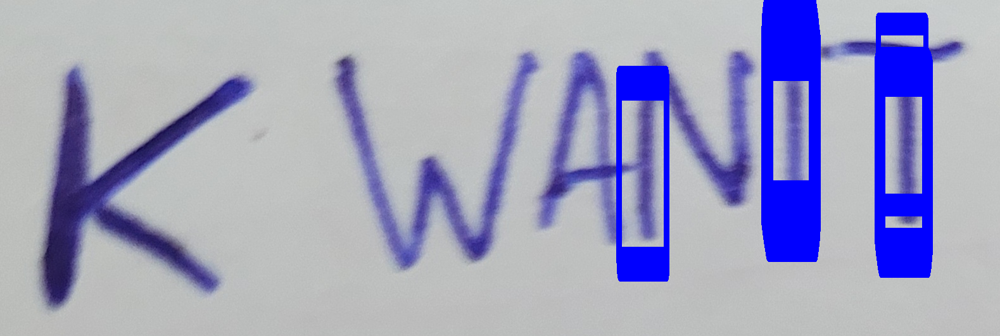

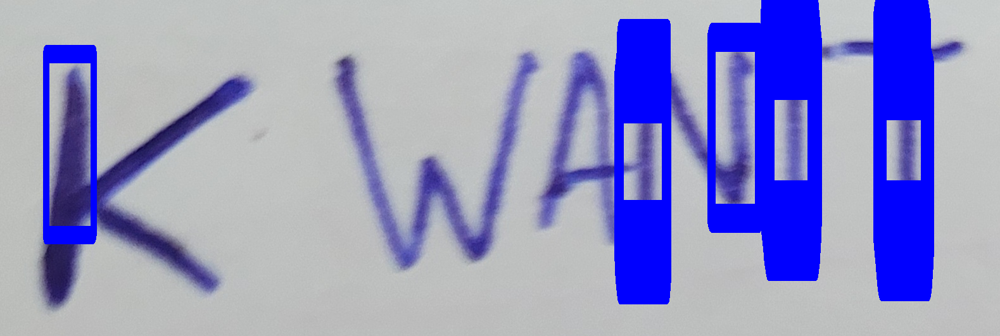

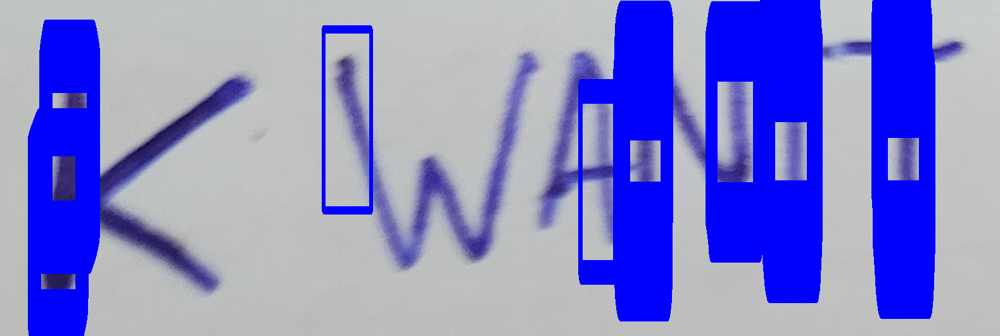

In [92]:
detect('/content/Name.jpg','/content/Letter_I.jpg',0.8,cv2.TM_CCOEFF_NORMED)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.7,cv2.TM_CCOEFF_NORMED)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.6,cv2.TM_CCOEFF_NORMED)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.5,cv2.TM_CCOEFF_NORMED)

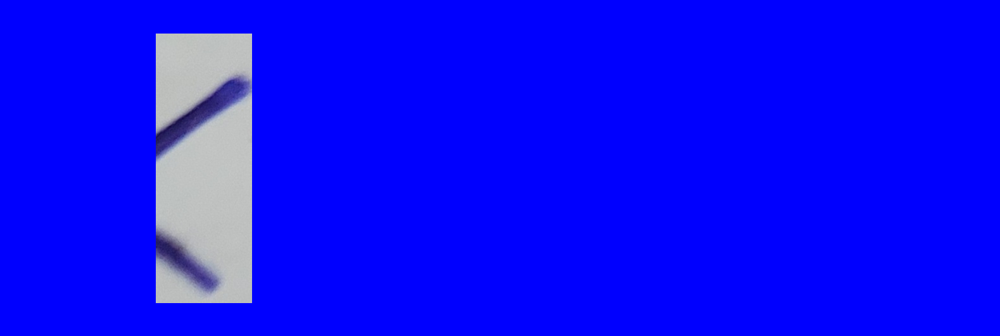

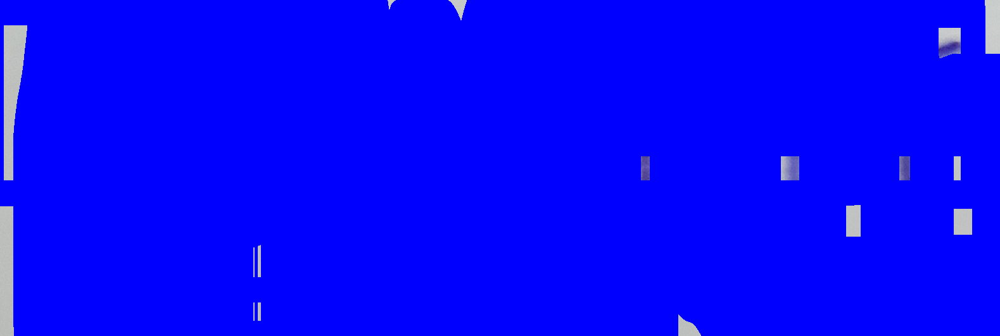

In [115]:
detect('/content/Name.jpg','/content/Letter.jpg',0.999,cv2.TM_CCOEFF)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.999,cv2.TM_CCOEFF)

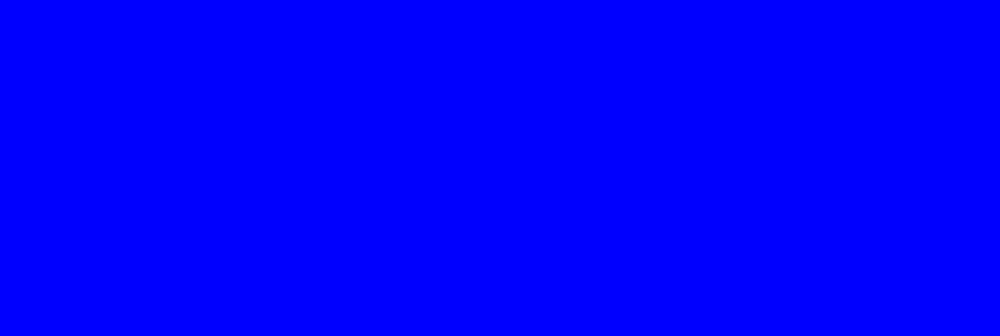

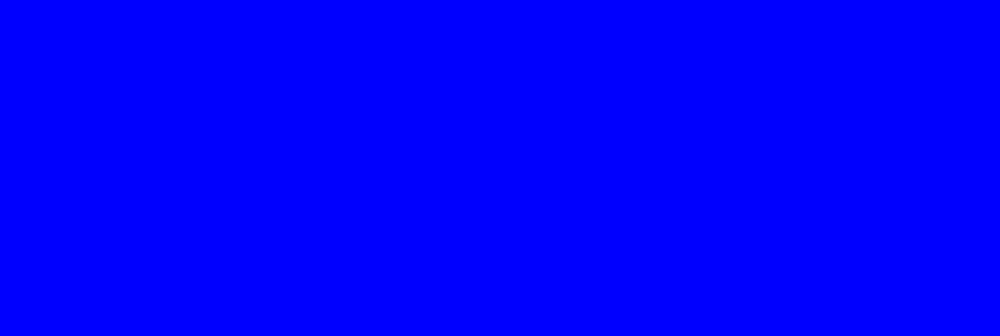

In [113]:
detect('/content/Name.jpg','/content/Letter.jpg',0.999,cv2.TM_CCORR)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.999,cv2.TM_CCORR)

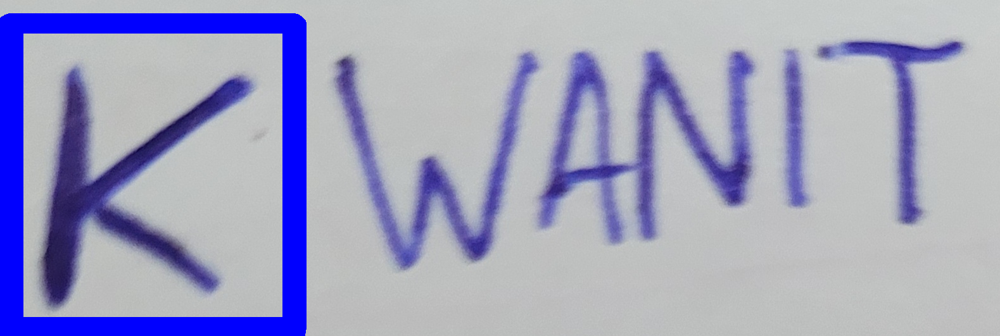

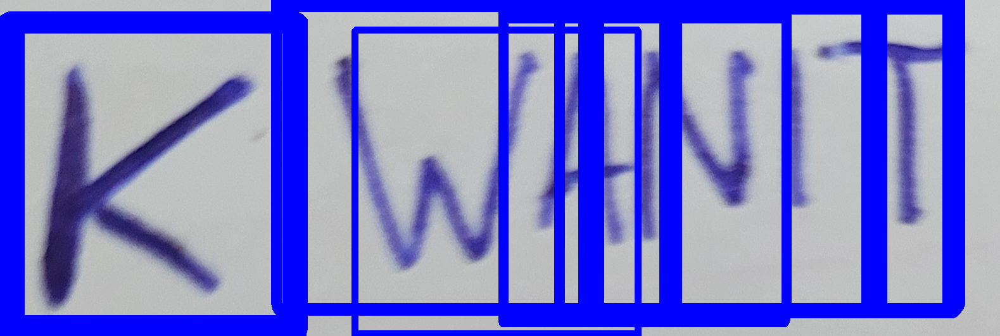

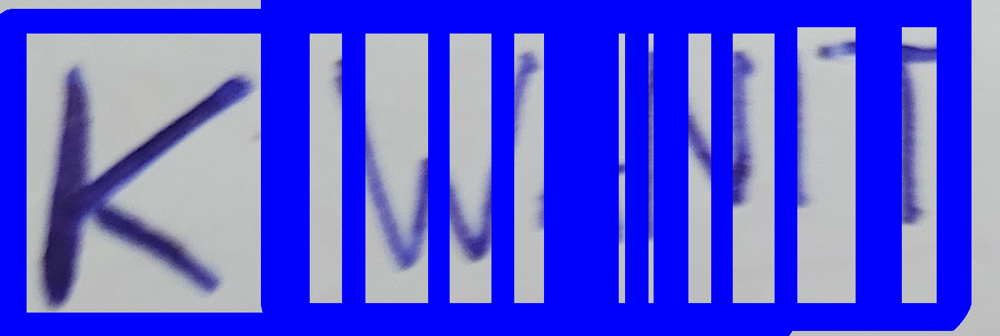

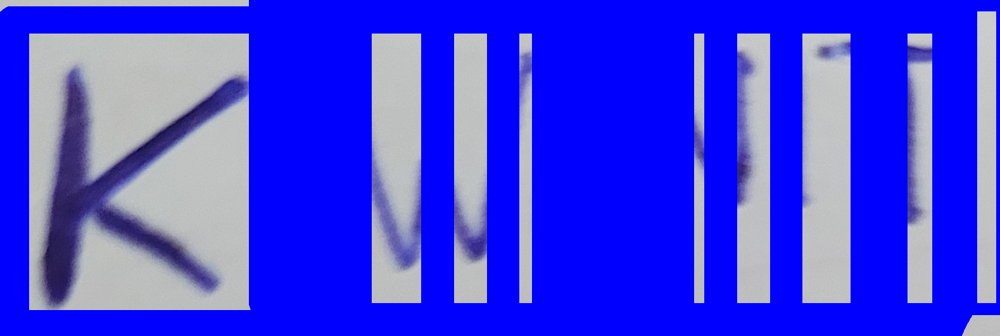

In [111]:
detect('/content/Name.jpg','/content/Letter.jpg',0.97,cv2.TM_CCORR_NORMED)
detect('/content/Name.jpg','/content/Letter.jpg',0.9675,cv2.TM_CCORR_NORMED)
detect('/content/Name.jpg','/content/Letter.jpg',0.965,cv2.TM_CCORR_NORMED)
detect('/content/Name.jpg','/content/Letter.jpg',0.9625,cv2.TM_CCORR_NORMED)

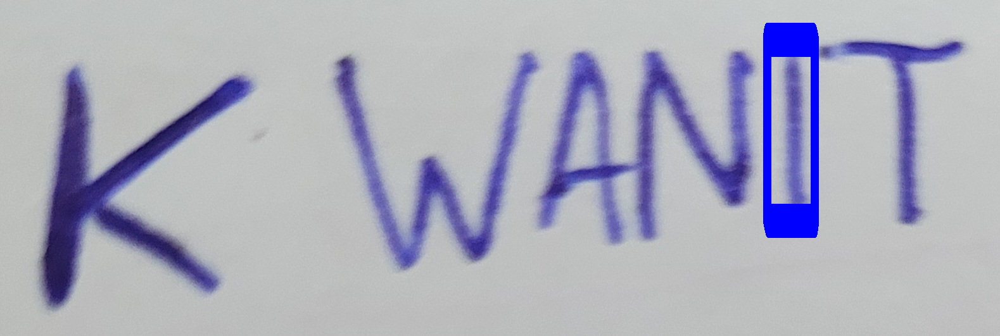

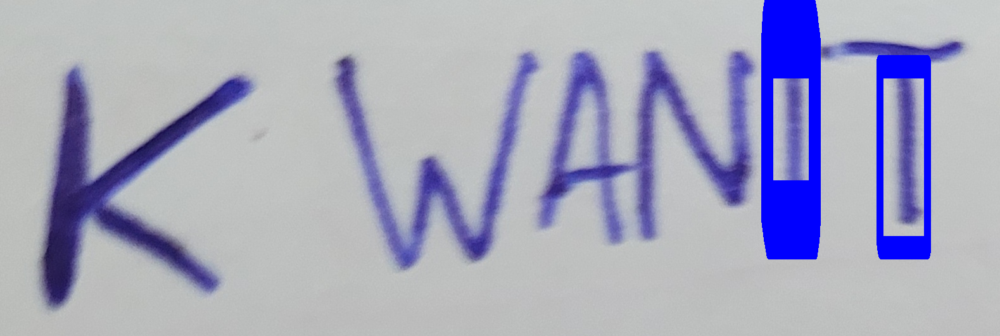

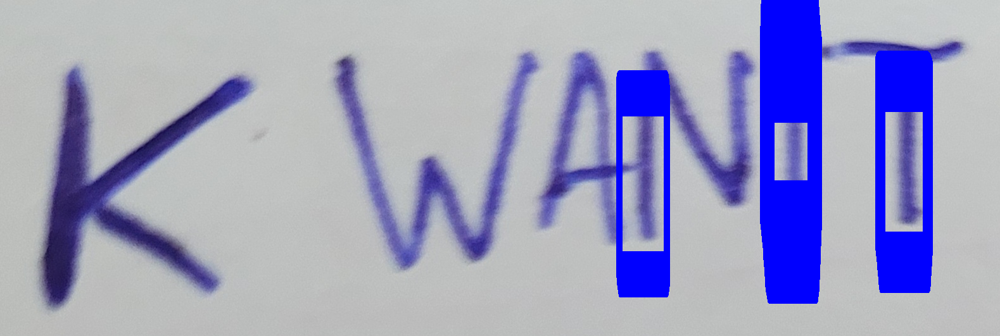

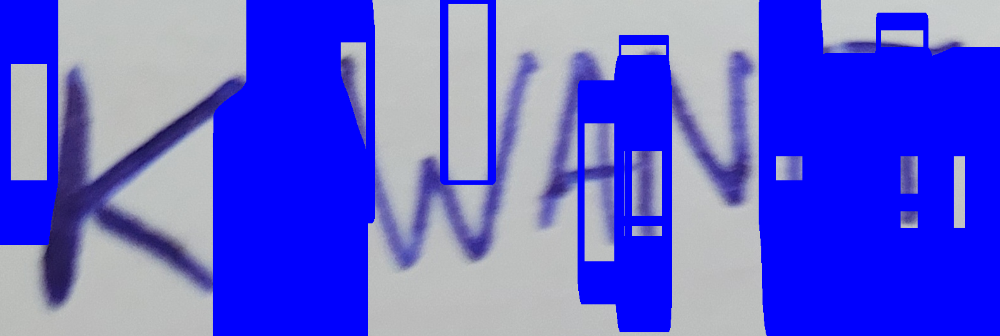

In [110]:
detect('/content/Name.jpg','/content/Letter_I.jpg',0.995,cv2.TM_CCORR_NORMED)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.99,cv2.TM_CCORR_NORMED)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.985,cv2.TM_CCORR_NORMED)
detect('/content/Name.jpg','/content/Letter_I.jpg',0.98,cv2.TM_CCORR_NORMED)

# Problem Statement-9

In [ ]:
def histogram_plot(img, channel, title, bin_size, mode='rgb'):
  if mode=='rgb':
    img = img[:,:,channel]
  min_value = np.min(img)
  max_value = np.max(img)
  plt.hist(img.ravel(),int((max_value-min_value)/bin_size),[0,256])
  plt.title(title)
  plt.show()

Original Image: (480, 640, 3)


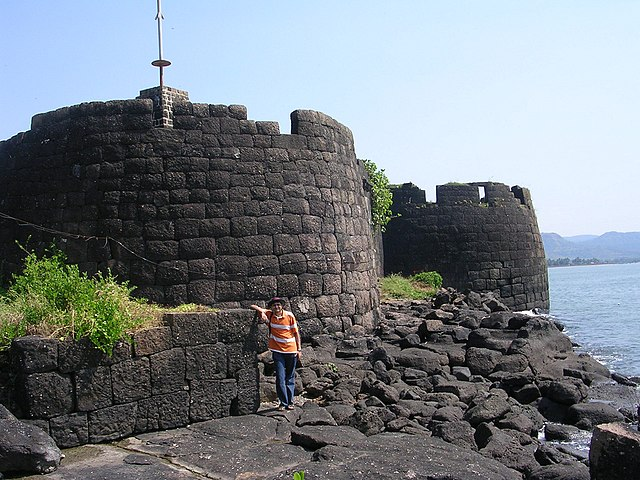

In [ ]:
img = cv2.imread('/content/Kolabafort.jpg')
print("Original Image:",img.shape)
cv2_imshow(img)

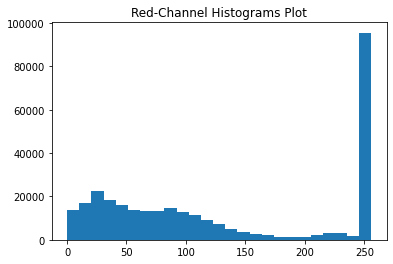

In [ ]:
histogram_plot(img, 0, 'Red-Channel Histograms Plot', 10)

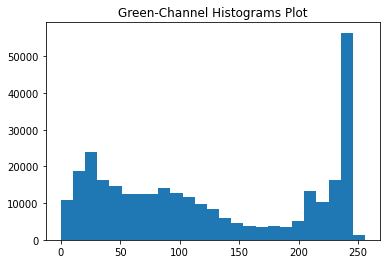

In [ ]:
histogram_plot(img, 1, 'Green-Channel Histograms Plot', 10)

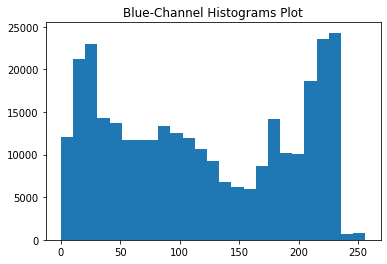

In [ ]:
histogram_plot(img, 2, 'Blue-Channel Histograms Plot', 10)

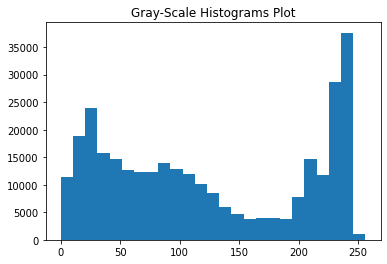

In [ ]:
gray_img = cv2.imread('/content/Kolabafort.jpg',0)
histogram_plot(gray_img, 0, 'Gray-Scale Histograms Plot', 10, 'gray')

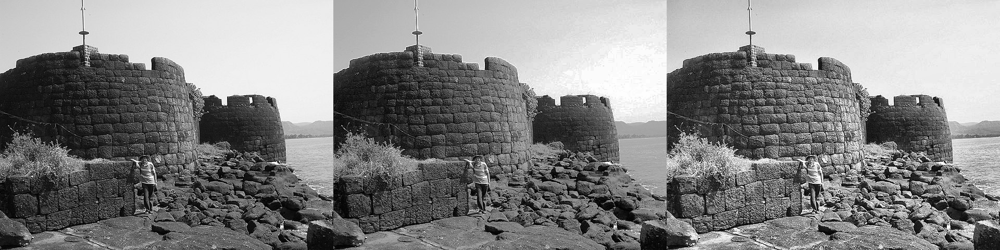

In [ ]:
global_img = cv2.equalizeHist(gray_img)
clahe_obj = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe_obj.apply(gray_img)
comp_img = np.hstack((gray_img, global_img, clahe_img))
cv2_imshow(comp_img)

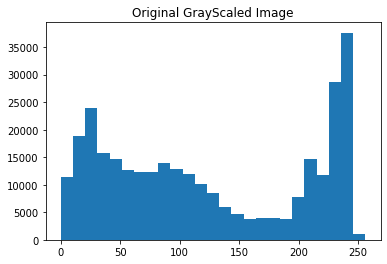

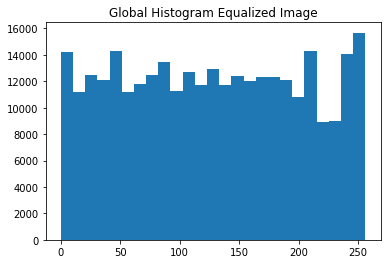

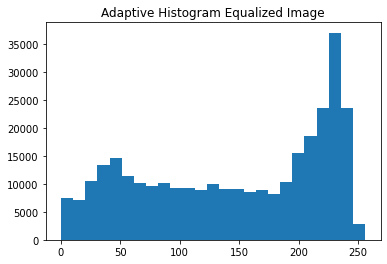

In [ ]:
histogram_plot(gray_img, 0, 'Original GrayScaled Image', 10, 'gray')
histogram_plot(global_img, 0, 'Global Histogram Equalized Image', 10, 'gray')
histogram_plot(clahe_img, 0, 'Adaptive Histogram Equalized Image', 10, 'gray')

# Problem Statement-10

Original Image: (68, 282, 3)


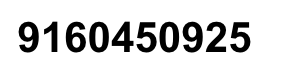

In [ ]:
img = cv2.imread('/content/Assignment-1/Problem-10/Screenshot 2023-01-08 at 5.14.24 PM.png')
print("Original Image:",img.shape)
cv2_imshow(img)

Original Image: (164, 332, 3)


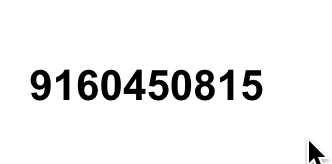

In [ ]:
img1 = cv2.imread('/content/Assignment-1/Problem-10/Screenshot 2023-01-08 at 5.14.47 PM.png')
print("Original Image:",img1.shape)
cv2_imshow(img1)

In [ ]:
extracted_img = pytesseract.image_to_string(img)
print(extracted_img[-5:-2])

925


In [ ]:
extracted_img1 = pytesseract.image_to_string(img1)
print(extracted_img1[-5:-2])

815
